# Section1 Business Understanding
**使用Jax, Pytorch或者TensorFlow训练一个神经网络, 将三维0均值, 单位协方差阵的正态分布数据投影到单位半径球的表面上**

## 大致思路
1. 生成服从三位标准正态分布的数据点
2. 找到一种映射, 将三维数据点投影到单位球表面
3. 训练一个全连接神经网络来拟合这种映射
4. 进行超参数调优(minibatch size/epoch number/database size/initialization), 要显式展现grdient变化
5. 获取epoch number和训练/验证表现之间的函数关系
6. 找到一种合适的度量, 来评估测试集表现


# Section2 Data Understanding
数据源是人工合成数据, 合成过程有两步
1. 生成3d标准正态分布数据点
2. 将正态分布生成的数据点映射到球面上, 意味着在3d欧氏空间中, 距原点的距离为1, 实现方案就是对三维原始坐标进行缩放, 缩放到向量模长为1
$$\mathbf{x_{unit}} = \frac{\mathbf{x}}{\lVert \mathbf{x} \rVert}$$



# Section3 Data Preparation

- Randomized 3-d Standard Normal Distribution Data Generation

- Mapping function 

- Pytorch Dataset/Dataloader function



In [2]:
import numpy as np
from typing import List
def multivariate_norm_generator(mu_in:List, cov_mat_in: List, sample_size_in: int):
    return np.random.multivariate_normal(mu_in, cov_mat_in, sample_size_in)

In [2]:
test_mu = [0,0,0]
test_covmat = [[1,0,0],[0,1,0], [0,0,1]]

tmp_res = multivariate_norm_generator(test_mu, test_covmat, 100000)

In [3]:
tmp_res

array([[-0.18065496, -0.19344487,  1.70061643],
       [-1.2380317 , -0.66063288, -0.65660266],
       [ 0.72363299, -0.60767942,  1.26929442],
       ...,
       [ 1.46672351, -1.54890755,  0.53005165],
       [ 0.54952964, -2.12139013,  2.70773002],
       [ 0.15446881,  0.35144615,  0.32116689]])

In [4]:
tmp_res[:,0]

array([-0.18065496, -1.2380317 ,  0.72363299, ...,  1.46672351,
        0.54952964,  0.15446881])

In [5]:
np.var(tmp_res[:,2])

np.float64(0.9998222019080476)

In [6]:
test_point = tmp_res[0,:]

In [7]:
test_point

array([-0.18065496, -0.19344487,  1.70061643])

In [32]:
vec_length = np.linalg.norm(test_point)

In [34]:
scaled = test_point/vec_length

In [35]:
np.linalg.norm(scaled)

np.float64(0.9999999999999999)

In [8]:
tmp_res[0]

array([-0.18065496, -0.19344487,  1.70061643])

In [14]:
def sphere_coord_mapping(point_in:List):
    return point_in/np.linalg.norm(point_in)

In [16]:
scaled = list(map(sphere_coord_mapping, tmp_res))

## OK, 数据准备工作搞定了, 现在用plotly检查一下是否均匀分布在球体表面

In [5]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

def ms(x, y, z, radius, resolution=20):
    """Return the coordinates for plotting a sphere centered at (x,y,z)"""
    u, v = np.mgrid[0:2*np.pi:resolution*2j, 0:np.pi:resolution*1j]
    X = radius * np.cos(u)*np.sin(v) + x
    Y = radius * np.sin(u)*np.sin(v) + y
    Z = radius * np.cos(v) + z
    return (X, Y, Z)

# df = pd.read_csv('xyzr_sphere_coordinates.txt')


In [8]:
x_pns_surface, y_pns_surface, z_pns_surface = ms(0, 0, 0, 1, 100)

In [53]:
x_pns_surface

array([[0.00000000e+00, 3.17279335e-02, 6.34239197e-02, ...,
        6.34239197e-02, 3.17279335e-02, 1.22464680e-16],
       [0.00000000e+00, 3.17121200e-02, 6.33923085e-02, ...,
        6.33923085e-02, 3.17121200e-02, 1.22403642e-16],
       [0.00000000e+00, 3.16646951e-02, 6.32975065e-02, ...,
        6.32975065e-02, 3.16646951e-02, 1.22220590e-16],
       ...,
       [0.00000000e+00, 3.16646951e-02, 6.32975065e-02, ...,
        6.32975065e-02, 3.16646951e-02, 1.22220590e-16],
       [0.00000000e+00, 3.17121200e-02, 6.33923085e-02, ...,
        6.33923085e-02, 3.17121200e-02, 1.22403642e-16],
       [0.00000000e+00, 3.17279335e-02, 6.34239197e-02, ...,
        6.34239197e-02, 3.17279335e-02, 1.22464680e-16]])

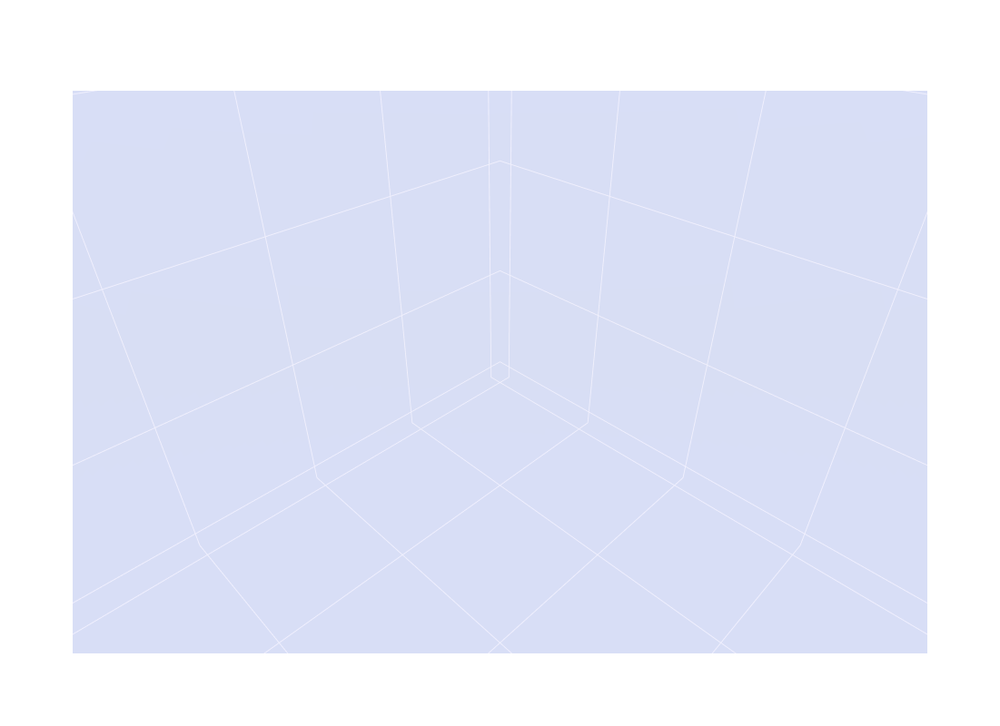

In [54]:
fixed_color = 'blue' 
color_value = 1

fig = go.Figure(data=go.Surface(x=x_pns_surface, y=y_pns_surface, z=z_pns_surface, opacity=0.03, showscale = False,
                                colorscale=[[0, fixed_color], [1, fixed_color]],cmin=color_value,cmax=color_value))
fig.update_layout(autosize=False, height = 800, width=800)
fig.show()

## 好了, 我们要的球也画好了, 现在我们把自己的数据点也画上去

**思路: 做一个dataframe, 要有id, 把点画上去, 用id着色, 如果整个色盘杂乱无章, 说明随机性好, 没有什么特别的生成pattern**

In [1]:
from DataPreparation import multivariate_norm_generator, map_one_point, multinorm_to_sphere_mapper

In [2]:
MU = [0, 0, 0]
COV_MAT = [[1, 0, 0], [0, 1, 0], [0, 0, 1]]
SAMPLE_SIZE = 2000

multinorm_data = multivariate_norm_generator(MU, COV_MAT, SAMPLE_SIZE)
sphere_coord = multinorm_to_sphere_mapper(multinorm_data)
# sphere_coord = np.array(sphere_coord)

In [3]:
len(sphere_coord)

2000

In [63]:
sphere_coord =[ ele.tolist() for ele in sphere_coord]

In [88]:
sphere_coord = np.array(sphere_coord)

In [67]:
import pandas as pd
coord_df = pd.DataFrame({}, columns= ['id', 'multinorm_val', 'sphere_coord'])

In [69]:
coord_df['id'] = range(500)

In [77]:
coord_df['multinorm_val'] = multinorm_data.tolist()

In [79]:
coord_df['sphere_coord'] = sphere_coord

In [83]:
# scaling_const = np.linalg.norm(coord_df['multinorm_val'].iloc[0])

In [14]:
fixed_color = 'blue' 
color_value = 1
scatter_colors = np.linspace(0, 1, sphere_coord.shape[0])


fig = go.Figure(data=go.Surface(x=x_pns_surface, y=y_pns_surface, z=z_pns_surface, opacity=0.2, showscale = False,
                                colorscale=[[0, fixed_color], [1, fixed_color]],cmin=color_value,cmax=color_value))

fig.add_trace(go.Scatter3d(
    x=sphere_coord[:,0] , 
    y=sphere_coord[:,1] , 
    z=sphere_coord[:,2] ,
    opacity = 0.3,
    mode='markers',
    marker=dict(
        size=5, 
        color=scatter_colors,  
        colorscale=[[0, 'red'], [1, 'yellow']],  
        # colorbar=dict(title='Array Index')
)))

fig.update_layout(autosize=False, height = 800, width=1000)
fig.show()

In [1]:
sphere_coord.shape[0]

NameError: name 'sphere_coord' is not defined

## 好了, 让我们阶段总结下数据生成与可视化


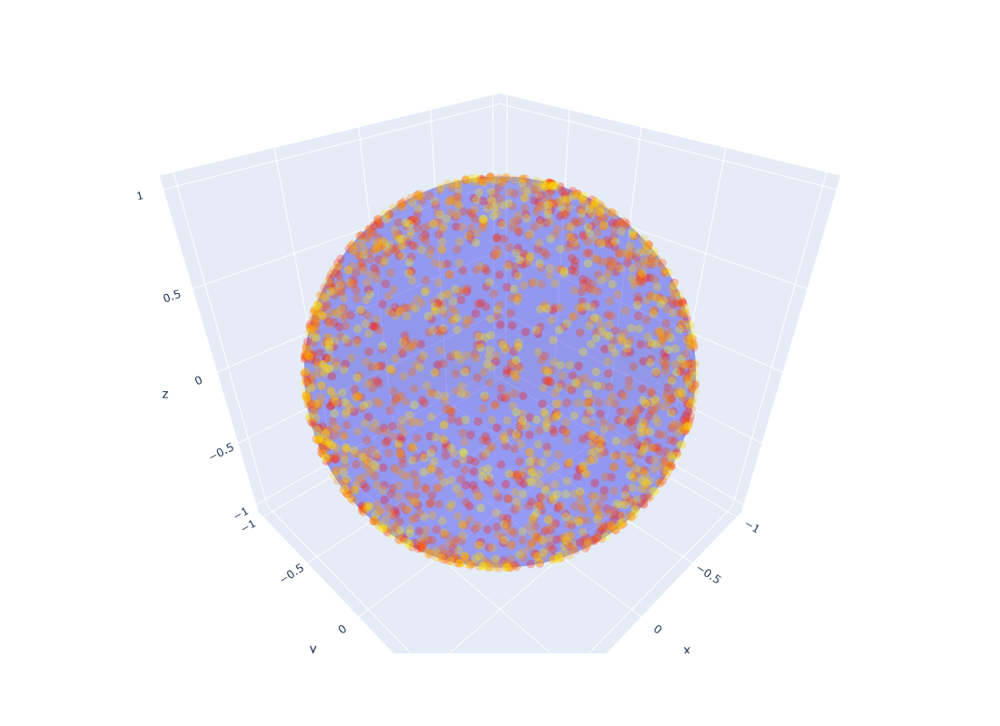

In [35]:
from generate_synthetic_data import multivariate_norm_generator, map_one_point, multinorm_to_sphere_mapper
import numpy as np
MU = [0, 0, 0]
COV_MAT = [[1, 0, 0], [0, 1, 0], [0, 0, 1]]
SAMPLE_SIZE = 2000

multinorm_data = multivariate_norm_generator(MU, COV_MAT, SAMPLE_SIZE)
sphere_coord = multinorm_to_sphere_mapper(multinorm_data)



import plotly.express as px
import plotly.graph_objects as go

def ms(x, y, z, radius, resolution=20):
    """Return the coordinates for plotting a sphere centered at (x,y,z)"""
    u, v = np.mgrid[0:2*np.pi:resolution*2j, 0:np.pi:resolution*1j]
    X = radius * np.cos(u)*np.sin(v) + x
    Y = radius * np.sin(u)*np.sin(v) + y
    Z = radius * np.cos(v) + z
    return (X, Y, Z)

fixed_color = 'blue' 
color_value = 1
scatter_colors = np.linspace(0, 1, sphere_coord.shape[0])

x_pns_surface, y_pns_surface, z_pns_surface = ms(0, 0, 0, 1, 100)
fig = go.Figure(data=go.Surface(x=x_pns_surface, y=y_pns_surface, z=z_pns_surface, opacity=0.2, showscale = False,
                                colorscale=[[0, fixed_color], [1, fixed_color]],cmin=color_value,cmax=color_value))

fig.add_trace(go.Scatter3d(
    x=sphere_coord[:,0] , 
    y=sphere_coord[:,1] , 
    z=sphere_coord[:,2] ,
    opacity = 0.3,
    mode='markers',
    marker=dict(
        size=5, 
        color=scatter_colors,  
        colorscale=[[0, 'red'], [1, 'yellow']],  
        # colorbar=dict(title='Array Index')
)))

fig.update_layout(autosize=False, height = 800, width=1000)
fig.show()


In [2]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

class SphereSurfaceDataset(Dataset):
    """Dataset of multinorm data points and corresponding coordinates mapped to unit sphere surface.

   Parent class: Dataset (torch.utils.data.Dataset): Abstract base class,
   the __len__ and __getitem__ methods need to be overriden. 
    """
    
    def __init__(self, multinorm_array_in: np.ndarray, sphere_coord_in: np.ndarray):
        """SphereSurfaceDataset class initialization

        Args:
            multinorm_array_in (np.ndarray): generated multinorm datapoints.
            sphere_coord_in (np.ndarray): unit sphere surface coordinates mapped
            from multinorm datapoints.
        """
        assert multinorm_array_in.shape[0] == \
            sphere_coord_in.shape[0], 'Input and out put dimensionalites do not match.'
        
        self.input = multinorm_array_in
        self.ground_truth = sphere_coord_in


    def __len__(self) -> int:
        """Get the size of dataset.

        Returns:
            int: the size of input dataset.
        """
        return self.input.shape[0]
    
    def __getitem__(self, idx_in: int) -> tuple[torch.Tensor, torch.Tensor]:
        """Get a data point from dataset with given idex.

        Args:
            idx_in (int): index of the data point to retrieve.

        Returns:
            tuple[torch.Tensor, torch.Tensor]: tuple containing rhe input datapoint and ground truth.
        """
        input_value = torch.tensor(self.input[idx_in], dtype=torch.float32)
        mapped_value = torch.tensor(self.ground_truth[idx_in], dtype=torch.float32)
        
        return input_value, mapped_value




In [3]:
test_dataset = SphereSurfaceDataset(multinorm_data, sphere_coord)

In [4]:
test_dataset[5]

(tensor([-1.1903,  0.8406,  0.3549]), tensor([-0.7936,  0.5605,  0.2367]))

## OK, Dataset类也算是重写完了, 现在我们向Dataloader推进


In [5]:
test_multinorm = multivariate_norm_generator(MU, COV_MAT, 2000, 32167)
test_sphere = multinorm_to_sphere_mapper(test_multinorm)
test_dataset = SphereSurfaceDataset(test_multinorm, test_sphere)

In [6]:
raw_multinorm = multivariate_norm_generator(MU, COV_MAT, 10000)
raw_sphere = multinorm_to_sphere_mapper(raw_multinorm)
raw_dataset = SphereSurfaceDataset(raw_multinorm, raw_sphere)

In [7]:
from torch.utils.data import random_split

# 定义分割比例
train_ratio = 0.8
val_ratio = 0.2

# 计算每个子集的大小
total_size = len(raw_dataset)
train_size = int(train_ratio * total_size)
val_size = int(val_ratio * total_size)


train_dataset, val_dataset= random_split(raw_dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)



## 好了, 数据集的random split搞定, 下一步是定义model的结构

In [8]:
# 做如下约束: 如果层内有variable, 用nn定义, 如果没有variable, 用nn.functional定义

class SimpleMLP(nn.Module):
    def __init__(self):
        super(SimpleMLP, self).__init__()
        self.fc1 = nn.Linear(3, 20)
        self.fc2 = nn.Linear(20, 20)
        self.fc3 = nn.Linear(20, 20)
        self.fc4 = nn.Linear(20, 3)
    
    def forward(self, x):
        x = F.relu(self.fc1(x))  # 使用 F.relu 而不是 nn.ReLU
        x = F.relu(self.fc2(x))  # 使用 F.relu 而不是 nn.ReLU
        x = F.relu(self.fc3(x))  # 使用 F.relu 而不是 nn.ReLU
        x = self.fc4(x)          # 最后一层没有激活函数
        return x

# 先用这个简单的网络结构, 不考虑batch norm层等额外结构

## OK, 模型结构搞定, 我们进入训练和训练效果monitoring阶段

In [9]:
# import torch
# import torch.nn as nn
# import torch.optim as optim

# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model = SimpleMLP().to(device)
# # 定义损失函数和优化器
# criterion = nn.MSELoss()
# optimizer = optim.Adam(model.parameters(), lr=0.001)

# # 训练模型
# num_epochs = 20

# for epoch in range(num_epochs):
#     model.train()  # 设定模型为训练模式
#     running_loss = 0.0
    
#     for inputs, targets in train_loader:
#         # 确保数据在 GPU 上
#         inputs, targets = inputs.to(device), targets.to(device)
        
#         # 清空梯度
#         optimizer.zero_grad()
        
#         # 前向传播
#         outputs = model(inputs)
        
#         # 计算损失
#         loss = criterion(outputs, targets)
        
#         # 反向传播
#         loss.backward()
        
#         # 收集梯度信息
#         grad_info = {
#             'fc1': model.fc1.weight.grad.mean().item(),
#             'fc2': model.fc2.weight.grad.mean().item(),
#             'fc3': model.fc3.weight.grad.mean().item(),
#             'fc4': model.fc4.weight.grad.mean().item()
#         }
        
#         # 打印梯度信息
#         # print(f'Epoch [{epoch+1}/{num_epochs}], Gradients: {grad_info}')
        
#         # 更新权重
#         optimizer.step()
        
#         running_loss += loss.item()
    
#     # 打印每个 epoch 的损失
#     print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader)}')
    
#     # 进行验证
#     model.eval()
#     with torch.no_grad():
#         val_loss = 0.0
#         for val_inputs, val_targets in val_loader:
            
#             val_inputs, val_targets = val_inputs.to(device), val_targets.to(device)
            
#             val_outputs = model(val_inputs)
#             loss = criterion(val_outputs, val_targets)
#             val_loss += loss.item()
#         print(f'Validation Loss: {val_loss/len(val_loader)}')


Epoch [1/20], Loss: 0.16156229685246945
Validation Loss: 0.030813402961939573
Epoch [2/20], Loss: 0.02028446029871702
Validation Loss: 0.015392337838420644
Epoch [3/20], Loss: 0.010594606403261424
Validation Loss: 0.007595498289447278
Epoch [4/20], Loss: 0.00478547128662467
Validation Loss: 0.0037254509261401836
Epoch [5/20], Loss: 0.0028550908043980597
Validation Loss: 0.002798761775920866
Epoch [6/20], Loss: 0.002257786211092025
Validation Loss: 0.0023488360038754763
Epoch [7/20], Loss: 0.001937385126017034
Validation Loss: 0.002085408163111424
Epoch [8/20], Loss: 0.0017414539479650556
Validation Loss: 0.001967400596186053
Epoch [9/20], Loss: 0.0015930882431566715
Validation Loss: 0.001797906108549796
Epoch [10/20], Loss: 0.0014685625811107458
Validation Loss: 0.00163025020447094
Epoch [11/20], Loss: 0.0013676107176579535
Validation Loss: 0.0015823901812836993
Epoch [12/20], Loss: 0.0012979012117721141
Validation Loss: 0.0014860376286378596
Epoch [13/20], Loss: 0.0012198161529377103


In [9]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = SimpleMLP().to(device)
# 定义损失函数和优化器
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# 训练模型
num_epochs = 20
train_losses = []
val_losses = []

# 创建一个空的 DataFrame 来存储梯度信息
grad_df = pd.DataFrame(columns=['epoch', 'iteration', 'fc1_grad', 'fc2_grad', 'fc3_grad', 'fc4_grad'])

for epoch in range(num_epochs):
    model.train()  # 设定模型为训练模式
    running_loss = 0.0
    num_batches = len(train_loader)
    
    for i, (inputs, targets) in enumerate(train_loader):
        # 确保数据在 GPU 上
        inputs, targets = inputs.to(device), targets.to(device)
        
        # 清空梯度
        optimizer.zero_grad()
        
        # 前向传播
        outputs = model(inputs)
        
        # 计算损失
        loss = criterion(outputs, targets)
        
        # 反向传播
        loss.backward()
        
        # 收集梯度信息
        grad_info = {
            'epoch': epoch + 1,
            'iteration': i + 1,
            'fc1_grad': model.fc1.weight.grad.mean().item(),
            'fc2_grad': model.fc2.weight.grad.mean().item(),
            'fc3_grad': model.fc3.weight.grad.mean().item(),
            'fc4_grad': model.fc4.weight.grad.mean().item()
        }
        
        # 将梯度信息添加到 DataFrame 中
        grad_df = pd.concat([grad_df, pd.DataFrame([grad_info])], ignore_index=True)
        
        # 更新权重
        optimizer.step()
        
        running_loss += loss.item()
    
    avg_train_loss = running_loss / num_batches
    train_losses.append(avg_train_loss)
    
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_train_loss}')
    
    # 进行验证
    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        for val_inputs, val_targets in val_loader:
            
            val_inputs, val_targets = val_inputs.to(device), val_targets.to(device)
            
            val_outputs = model(val_inputs)
            loss = criterion(val_outputs, val_targets)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    print(f'Validation Loss: {avg_val_loss}')


C:\Users\zhaoj\AppData\Local\Temp\ipykernel_23380\1532443792.py:53: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Epoch [1/20], Loss: 0.19710018530488013
Validation Loss: 0.04660582193173468
Epoch [2/20], Loss: 0.029216325275599957
Validation Loss: 0.018346160417422652
Epoch [3/20], Loss: 0.013856355462223292
Validation Loss: 0.008485470418236218
Epoch [4/20], Loss: 0.005640165152028203
Validation Loss: 0.0036551500961650163
Epoch [5/20], Loss: 0.00315187234710902
Validation Loss: 0.0025956630634027533
Epoch [6/20], Loss: 0.0023686061669141055
Validation Loss: 0.002069971913442714
Epoch [7/20], Loss: 0.001921247618738562
Validation Loss: 0.0017205878411914455
Epoch [8/20], Loss: 0.0016270757452584803
Validation Loss: 0.0015243208963511279
Epoch [9/20], Loss: 0.0014299885537475347
Validation Loss: 0.0013839141956850654
Epoch [10/20], Loss: 0.0013044973965734244
Validation Loss: 0.0012611952552106231
Epoch [11/20], Loss: 0.0012057705288752913
Validation Loss: 0.0011482791596790776
Epoch [12/20], Loss: 0.001136248433496803
Validation Loss: 0.0011258716695010662
Epoch [13/20], Loss: 0.0010802876441739

NameError: name 'plt' is not defined

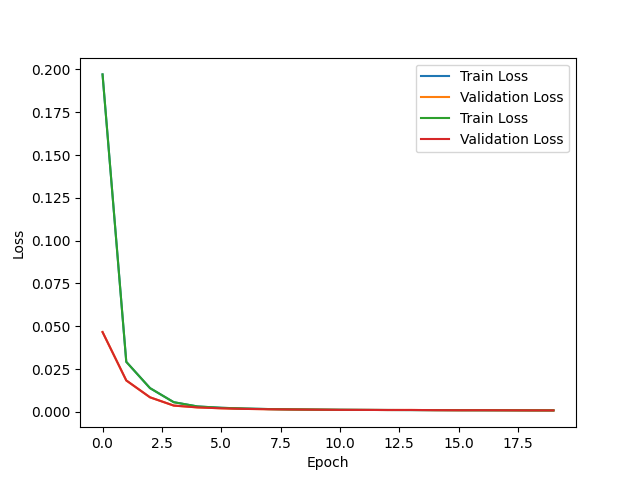

In [16]:
import matplotlib.pyplot as plt
%matplotlib ipympl

# 可视化训练和验证损失
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [11]:
%pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [12]:
import matplotlib.pyplot as plt

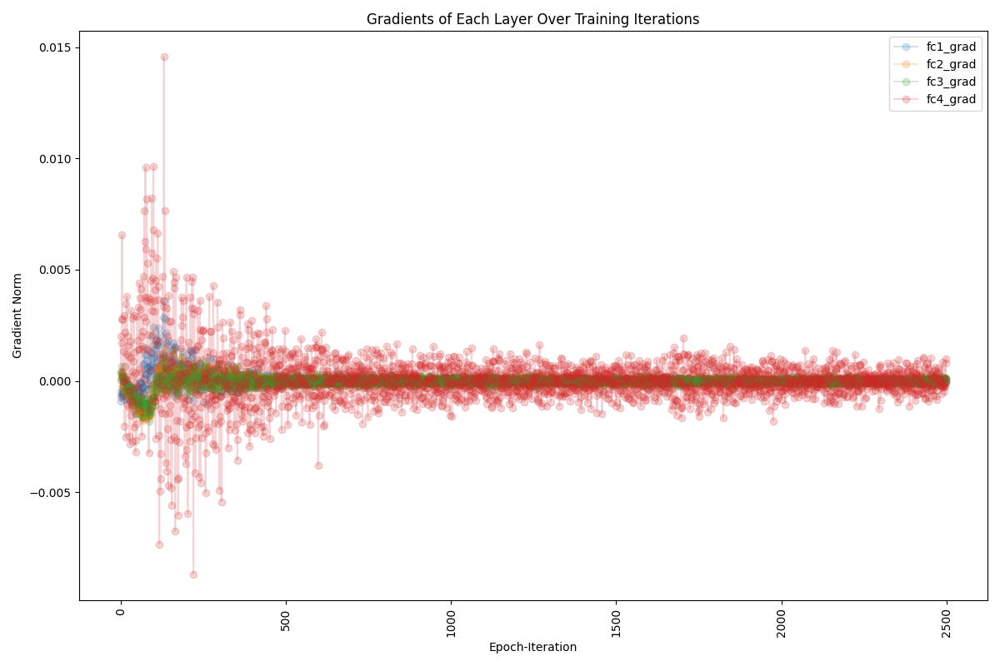

In [18]:
%matplotlib ipympl

grad_df['epoch_iter'] = grad_df['epoch'].astype(str) + '-' + grad_df['iteration'].astype(str)

# Plotting
plt.figure(figsize=(12, 8))
# plt.plot(grad_df['epoch_iter'], grad_df['fc1_grad'], label='fc1_grad', linestyle='-', marker='o', alpha = 0.1)
# plt.plot(grad_df['epoch_iter'], grad_df['fc2_grad'], label='fc2_grad', linestyle='-', marker='o', alpha = 0.1)
# plt.plot(grad_df['epoch_iter'], grad_df['fc3_grad'], label='fc3_grad', linestyle='-', marker='o', alpha = 0.1)
# plt.plot(grad_df['epoch_iter'], grad_df['fc4_grad'], label='fc4_grad', linestyle='-', marker='o', alpha = 0.1)

plt.plot(grad_df['fc1_grad'], label='fc1_grad', linestyle='-', marker='o', alpha = 0.2)
plt.plot(grad_df['fc2_grad'], label='fc2_grad', linestyle='-', marker='o', alpha = 0.2)
plt.plot(grad_df['fc3_grad'], label='fc3_grad', linestyle='-', marker='o', alpha = 0.2)
plt.plot(grad_df['fc4_grad'], label='fc4_grad', linestyle='-', marker='o', alpha = 0.2)

plt.xlabel('Epoch-Iteration')
plt.ylabel('Gradient Norm')
plt.title('Gradients of Each Layer Over Training Iterations')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()

plt.show()

In [20]:
grad_df.columns

Index(['epoch', 'iteration', 'fc1_grad', 'fc2_grad', 'fc3_grad', 'fc4_grad',
       'epoch_iter'],
      dtype='object')

In [27]:
%pip install ipympl


   ---------------------------------------- 0.0/516.3 kB ? eta -:--:--
   --------- ------------------------------ 122.9/516.3 kB 3.6 MB/s eta 0:00:01
   ------------------------------- -------- 409.6/516.3 kB 5.1 MB/s eta 0:00:01
   ---------------------------------------- 516.3/516.3 kB 5.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


## OK, 进入测试部分

In [24]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

model.eval()
all_predictions = []
all_targets = []

with torch.no_grad():
    for inputs, targets in test_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        
        outputs = model(inputs)
        
        all_predictions.append(outputs.cpu().numpy())
        all_targets.append(targets.cpu().numpy())

all_predictions = np.concatenate(all_predictions, axis=0)
all_targets = np.concatenate(all_targets, axis=0)

mse = mean_squared_error(all_targets, all_predictions)
mae = mean_absolute_error(all_targets, all_predictions)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")

Mean Squared Error: 0.0007867966196499765
Mean Absolute Error: 0.019879527390003204


In [19]:
print(model)

SimpleMLP(
  (fc1): Linear(in_features=3, out_features=20, bias=True)
  (fc2): Linear(in_features=20, out_features=20, bias=True)
  (fc3): Linear(in_features=20, out_features=20, bias=True)
  (fc4): Linear(in_features=20, out_features=3, bias=True)
)


In [23]:
%pip install scikit-learn

   ---------------------------------------- 0.0/10.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.9 MB 653.6 kB/s eta 0:00:17
    --------------------------------------- 0.1/10.9 MB 1.7 MB/s eta 0:00:07
   - -------------------------------------- 0.4/10.9 MB 2.8 MB/s eta 0:00:04
   -- ------------------------------------- 0.8/10.9 MB 4.4 MB/s eta 0:00:03
   ---- ----------------------------------- 1.3/10.9 MB 5.7 MB/s eta 0:00:02
   ------- -------------------------------- 2.1/10.9 MB 8.3 MB/s eta 0:00:02
   ------- -------------------------------- 2.1/10.9 MB 8.3 MB/s eta 0:00:02
   ------- -------------------------------- 2.1/10.9 MB 8.3 MB/s eta 0:00:02
   --------- ------------------------------ 2.5/10.9 MB 6.2 MB/s eta 0:00:02
   ------------- -------------------------- 3.8/10.9 MB 8.6 MB/s eta 0:00:01
   ----------------- ---------------------- 4.9/10.9 MB 9.5 MB/s eta 0:00:01
   ---------------------- ----------------- 6.1/10.9 MB 10.8 MB/s eta 0:00:01
   

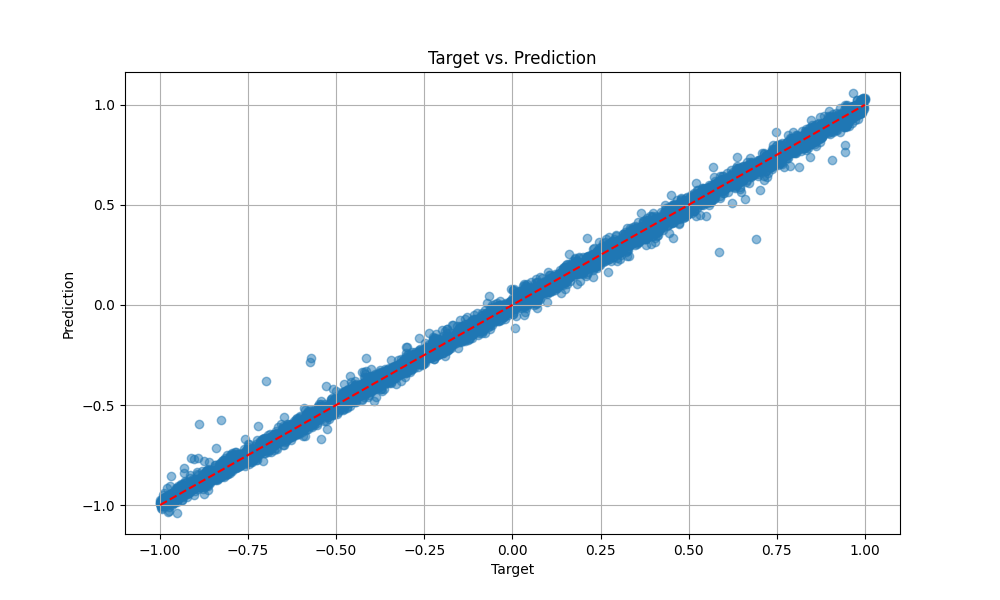

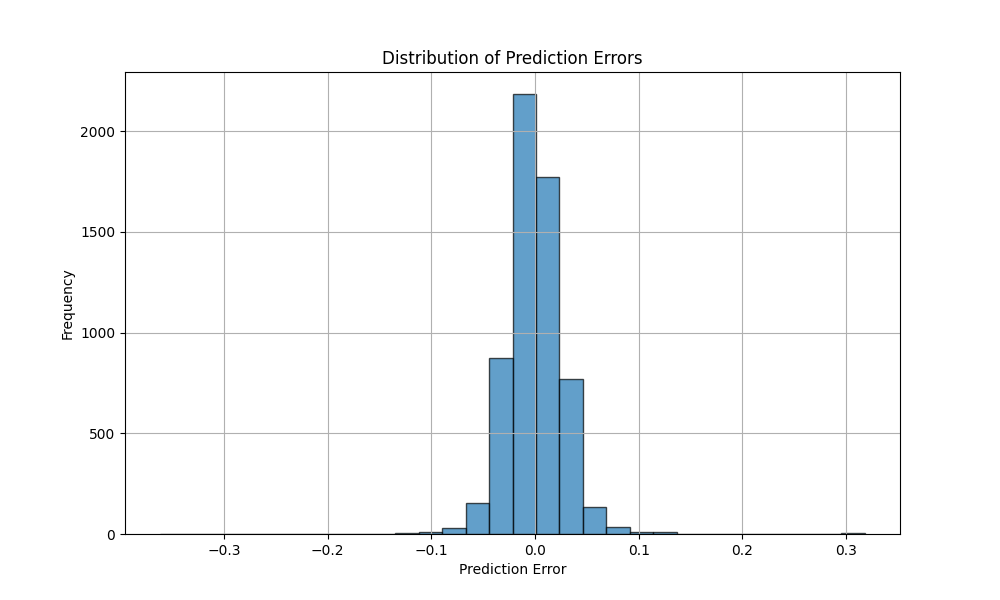

Sample 0: Target = [-0.25128055 -0.39546356 -0.88344026], Prediction = [-0.25833765 -0.38901675 -0.88949937], Error = -0.007057100534439087
Sample 1: Target = [0.414794   0.901166   0.12587976], Prediction = [0.41281027 0.88703454 0.09786598], Error = 0.006446808576583862
Sample 2: Target = [ 0.85245675  0.15210868 -0.5001804 ], Prediction = [ 0.88790905  0.15018703 -0.50324863], Error = -0.006059110164642334
Sample 3: Target = [-0.5338365  -0.77463305  0.3390608 ], Prediction = [-0.53146785 -0.79488885  0.3337226 ], Error = -0.001983731985092163
Sample 4: Target = [-0.1570138  -0.45500728  0.87653583], Prediction = [-0.10448553 -0.47870624  0.87046707], Error = -0.014131486415863037


In [25]:
# 创建 DataFrame
df_comparison = pd.DataFrame({
    'Target': all_targets.flatten(),
    'Prediction': all_predictions.flatten()
})

# 可视化
plt.figure(figsize=(10, 6))
plt.scatter(df_comparison['Target'], df_comparison['Prediction'], alpha=0.5)
plt.xlabel('Target')
plt.ylabel('Prediction')
plt.title('Target vs. Prediction')
plt.plot([df_comparison['Target'].min(), df_comparison['Target'].max()], 
         [df_comparison['Target'].min(), df_comparison['Target'].max()], 'r--')
plt.grid(True)
plt.show()

# 计算并绘制误差分布
df_comparison['Error'] = df_comparison['Prediction'] - df_comparison['Target']

plt.figure(figsize=(10, 6))
plt.hist(df_comparison['Error'], bins=30, edgecolor='k', alpha=0.7)
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.title('Distribution of Prediction Errors')
plt.grid(True)
plt.show()

# 打印前几个数据点的目标、预测值和误差
for i in range(5):
    print(f"Sample {i}: Target = {all_targets[i]}, Prediction = {all_predictions[i]}, Error = {df_comparison['Error'].iloc[i]}")